In [1]:
!which python

/c/Users/junec/AppData/Local/Programs/Python/Python38/python


In [2]:
import struct 
struct.calcsize("P")*8

32

In [3]:
# !pip list

In [4]:
# !pip install openpyxl

In [5]:
import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple

In [29]:
def load_data_from_txt(pressure_file:str, rate_file:str, colum_names:Dict[str,List[str]]
                   ={"pressure":["Elapsed time","Data"],
                    "rate":["Elapsed time","Liquid rate"]})->(pd.DataFrame,pd.DataFrame,pd.DataFrame): 
    pressure_time, pressure_measure=colum_names["pressure"]
    rate_time, rate_measure = colum_names["rate"]
    pressure_df = pd.read_csv(pressure_file, delimiter=" ",skiprows=2, names=[pressure_time, pressure_measure],skipinitialspace = True) 
    rate_df = pd.read_csv(rate_file, delimiter=" ",skiprows=2, names=[rate_time, rate_measure],skipinitialspace = True) 
    pressure_rate = pd.concat([pressure_df, rate_df]).sort_values(by=pressure_time) 
    return pressure_df,rate_df,pressure_rate

In [30]:
pressure_file="../data_input/EAGE_Shchipanov_2017/Pressure.txt"
rate_file="../data_input/EAGE_Shchipanov_2017/Rate.txt"
pressure_df,rate_df,pressure_rate=load_data_from_txt(pressure_file, rate_file)
display(pressure_df)
display(rate_df)
# pressure_rate

,Elapsed time,Data
0,0.000000,2988.99
1,0.495833,2991.28
2,0.516667,2994.32
3,0.545833,2996.70
4,0.566667,2999.12
...,...,...
29808,4063.495571,7938.65
29809,4065.499737,7939.53
29810,4067.503904,7940.92
29811,4069.508071,7941.22


,Elapsed time,Liquid rate
0,0.433384,-3916.602731
1,2.516718,-3913.489043
2,4.600051,-3911.804387
3,6.641718,-3910.573563
4,7.683384,-3907.017652
...,...,...
10186,4074.862089,-18459.075655
10187,4075.028756,-18423.899451
10188,4075.237089,-18412.745895
10189,4075.362089,-18413.519153


In [8]:
def calculate_derivative(x_coordinate:List[float],y_coordinate:List[float])->List[float]:
    """
    calculate forward derivative, the last point use the backforward derivative
    Args:
            x_coordinate: the value of x coordinate
            y_coordinate: the value of y coordinate

        Returns:
            derivative.
    """
    if len(x_coordinate)!=len(y_coordinate):
        print(f"the length of x_coordinate '{len(x_coordinate)}' is not equal to the length of y_coordinate '{len(y_coordinate)}'")
        return None
    
    length=len(y_coordinate)
    
    derivative=[0.0]*length
    for i in range(length-1):
        derivative[i]=(y_coordinate[i+1]-y_coordinate[i])/(x_coordinate[i+1]-x_coordinate[i])

    #calculate for the last point
    derivative[-1]=(y_coordinate[length-1]-y_coordinate[length-2])/(x_coordinate[length-1]-x_coordinate[length-2])
    return derivative

In [9]:
#calculate first & second derivative

x_coordinate=pressure_df["Elapsed time"]
y_coordinate=pressure_df["Data"]
first_order_derivative=calculate_derivative(x_coordinate,y_coordinate)

x_coordinate=pressure_df["Elapsed time"]
y_coordinate=first_order_derivative
second_order_derivative=calculate_derivative(x_coordinate,y_coordinate)

#add first and second derivative to pressure_df dataframe
pressure_df["first_order_derivative"]=first_order_derivative
pressure_df["second_order_derivative"]=second_order_derivative
# pd.set_option('display.max_rows', pressure_df.shape[0]+1)
display(pressure_df)

,Elapsed time,Data,first_order_derivative,second_order_derivative
0,0.000000,2988.99,4.618487,284.977831
1,0.495833,2991.28,145.919995,-3087.359588
2,0.516667,2994.32,81.600002,1184.914121
3,0.545833,2996.70,116.159996,-1817.279726
4,0.566667,2999.12,78.300001,-168.428622
...,...,...,...,...
29808,4063.495571,7938.65,0.439085,0.126970
29809,4065.499737,7939.53,0.693555,-0.271368
29810,4067.503904,7940.92,0.149688,-0.123142
29811,4069.508071,7941.22,-0.097110,0.000000


In [10]:
def detect_breakpoints(first_order_derivative,second_order_derivative):
    breakpoints=[]
    std=statistics.stdev(first_order_derivative)
    print(std)
    for i in range(len(first_order_derivative)-1):
        if (first_order_derivative[i]>0)^(first_order_derivative[i+1]>0) and abs(first_order_derivative[i+1])>2*std :
#         if (first_order_derivative[i]>0)^(first_order_derivative[i+1]>0):
            breakpoints.append(i+1)
#         elif abs(first_order_derivative[i+1]-first_order_derivative[i])>3.3:
#             breakpoints.append(i+1)
#         elif abs(second_order_derivative[i+1]-second_order_derivative[i])>0.1:
#             breakpoints.append(i+1)
#         elif abs(second_order_derivative[i])>0.1:
#             breakpoints.append(i)
    return breakpoints


breakpoints=detect_breakpoints(first_order_derivative,second_order_derivative)
print(len(breakpoints))
# print(breakpoints)

993.2336512455328
39


In [12]:
def detect_breakpoints_2(first_order_derivative):
    breakpoints=[]
    std=statistics.stdev(first_order_derivative)
    print(std)
    compare_point=first_order_derivative[0]
    for i in range(len(first_order_derivative)-1):
        if (compare_point>0)^(first_order_derivative[i+1]>0):
            if (abs(first_order_derivative[i+1]-first_order_derivative[i])>2.3*std) and (abs(first_order_derivative[i+1])>2.4*std) :
                breakpoints.append(i+1)
                compare_point=first_order_derivative[i+1]
#             else:
#                 compare_point=first_order_derivative[i]
        else:
            compare_point=first_order_derivative[i+1]
            
 
    return breakpoints


breakpoints=detect_breakpoints_2(first_order_derivative)
print(len(breakpoints))
# print(breakpoints)

993.2336512455328
53


In [13]:
def detect_breakpoints_3(first_order_derivative,second_order_derivative):
#     first_order_derivative=pressure_df["first_order_derivative"]
#     second_order_derivative=pressure_df["second_order_derivative"]
    breakpoints=[]
#     denoised_first_order_derivative=[]
    std_1=statistics.stdev(first_order_derivative)
    std_2=statistics.stdev(second_order_derivative)
    print(std_1,std_2)
    compare_point=first_order_derivative[0]
    for i in range(len(first_order_derivative)-1):
#         denoised_first_order_derivative.append(compare_point)
        if (compare_point>0)^(first_order_derivative[i+1]>0):
            if (abs(second_order_derivative[i+1])>2.4*std_2) and (abs(first_order_derivative[i+1])>2.4*std_1) :
                breakpoints.append(i+1)
                compare_point=first_order_derivative[i+1]
        else:
            compare_point=first_order_derivative[i+1]
  
 
    return breakpoints


breakpoints=detect_breakpoints_3(first_order_derivative,second_order_derivative)
print(len(breakpoints))
# print(breakpoints)
# denoised_first_order_derivative.append(first_order_derivative[-1])
# print(len(denoised_first_order_derivative))
# pressure_df["denoised_first_order_derivative"]=denoised_first_order_derivative

pressure_df
display(pressure_df.loc[0:1592])

993.2336512455328 192914.8008199997
53


,Elapsed time,Data,first_order_derivative,second_order_derivative
0,0.000000,2988.99,4.618487,284.977831
1,0.495833,2991.28,145.919995,-3087.359588
2,0.516667,2994.32,81.600002,1184.914121
3,0.545833,2996.70,116.159996,-1817.279726
4,0.566667,2999.12,78.300001,-168.428622
...,...,...,...,...
1588,93.000022,3803.46,12.430769,-212.373973
1589,93.162522,3805.48,-22.080001,2003.327784
1590,93.266688,3803.18,186.599963,-13373.994977
1591,93.283355,3806.29,-36.299998,2398.500594


In [14]:

def detect_breakpoints_all(first_order_derivative):
    breakpoints=[]
    std=statistics.stdev(first_order_derivative)
    for i in range(len(first_order_derivative)):
        if first_order_derivative[i]>2.5*std:
            breakpoints.append(i+1)
    return breakpoints


breakpoints_all=detect_breakpoints_all(first_order_derivative)
print(len(breakpoints_all))
print(breakpoints_all)

105
[64, 65, 2252, 2253, 4891, 5771, 5772, 6544, 6545, 8605, 8606, 9620, 9621, 9623, 9624, 9626, 9627, 9641, 9642, 11484, 11485, 13040, 13041, 13051, 13052, 13549, 13550, 15433, 15434, 18457, 18458, 18460, 18461, 18464, 18465, 18815, 18816, 18818, 18819, 18824, 18825, 18830, 18831, 18847, 18848, 18893, 18894, 20362, 20363, 20368, 20369, 20371, 20372, 20380, 20381, 20386, 20387, 22183, 22184, 24264, 24265, 24687, 24688, 24690, 24691, 24764, 24765, 24768, 24769, 24772, 24773, 24775, 24776, 26019, 26020, 26022, 26023, 26025, 26504, 26505, 26507, 26783, 26784, 26792, 26793, 26795, 26796, 26814, 26815, 26841, 26842, 27316, 27317, 27963, 27964, 28243, 28244, 29122, 29123, 29125, 29126, 29547, 29548, 29550, 29551]


In [15]:
# pressure_time=pressure_df["Elapsed time"]
# denoised_points=[]
# denoised_points.append(pressure_df["Data"][0])
# for i in range(len(denoised_first_order_derivative)):
#     print("---------",i)
#     denoised=denoised_points[i]+(pressure_time[i+1]-pressure_time[i])*denoised_first_order_derivative[i]
#     print(denoised_first_order_derivative[i],pressure_df["first_order_derivative"][i],denoised,pressure_df["Data"][i+1])
#     denoised_points.append(denoised)

# print(len(denoised_points))
# plt.rcParams["figure.figsize"] = (20,3)
# plt.plot(pressure_df["Elapsed time"],pressure_df["Data"],color='red')
# plt.plot(pressure_df["Elapsed time"],denoised_points,color='blue')
# plt.show

In [16]:
def plot_4_metrics(pressure_df:pd.DataFrame,
               rate_df:pd.DataFrame,
               breakpoints:List[int],
               colum_names:Dict[str,List[str]]
                   ={"pressure":["Elapsed time","Data","first_order_derivative","second_order_derivative"],
                    "rate":["Elapsed time","Liquid rate"]})->None:
    
    pressure_time, pressure_measure,first_order_derivative,second_order_derivative=colum_names["pressure"]
    rate_time, rate_measure = colum_names["rate"]
    
    fig, axs = plt.subplots(nrows=4, sharex=True, dpi=100,figsize=(20,14), gridspec_kw={'height_ratios': [5, 3,3,3]})

    fig.suptitle('pressure ~ rate ~ first derivative ~ second derivative', 
              **{'family': 'Arial Black', 'size': 22, 'weight': 'bold'})

    #plot pressure and breakpoints
    axs[0].scatter(x=pressure_df[pressure_time],y=pressure_df[pressure_measure],color='red') 
    axs[0].set_ylabel(pressure_measure,fontsize=16)
    for breakpoint_index in breakpoints:
            axs[0].axvline(x=pressure_df[pressure_time][breakpoint_index])


    #plot rate and breakpoints       
    start_time=pressure_df.iloc[0][pressure_time]
    end_time=pressure_df.iloc[-1][pressure_time]
    rate_df=rate_df.loc[(rate_df[rate_time] >= start_time) & (rate_df[rate_time] <= end_time)]

    axs[1].scatter(x=rate_df[rate_time],y=rate_df[rate_measure],color='purple') 
    axs[1].set_ylabel(rate_measure,fontsize=16)
    for breakpoint_index in breakpoints:
            axs[1].axvline(x=pressure_df[pressure_time][breakpoint_index])

    #plot first derivative and breakpoints
    axs[2].scatter(x=pressure_df[pressure_time],y=pressure_df[first_order_derivative],color='blue') 
    axs[2].set_ylabel(first_order_derivative,fontsize=16)
    for breakpoint_index in breakpoints:
            axs[2].axvline(x=pressure_df[pressure_time][breakpoint_index])

    #plot second derivative and breakpoints
    axs[3].scatter(x=pressure_df[pressure_time],y=pressure_df[second_order_derivative],color='green') 
    axs[3].set_ylabel(second_order_derivative,fontsize=16)
    for breakpoint_index in breakpoints:
            axs[3].axvline(x=pressure_df[pressure_time][breakpoint_index])
    return None
    
    

findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


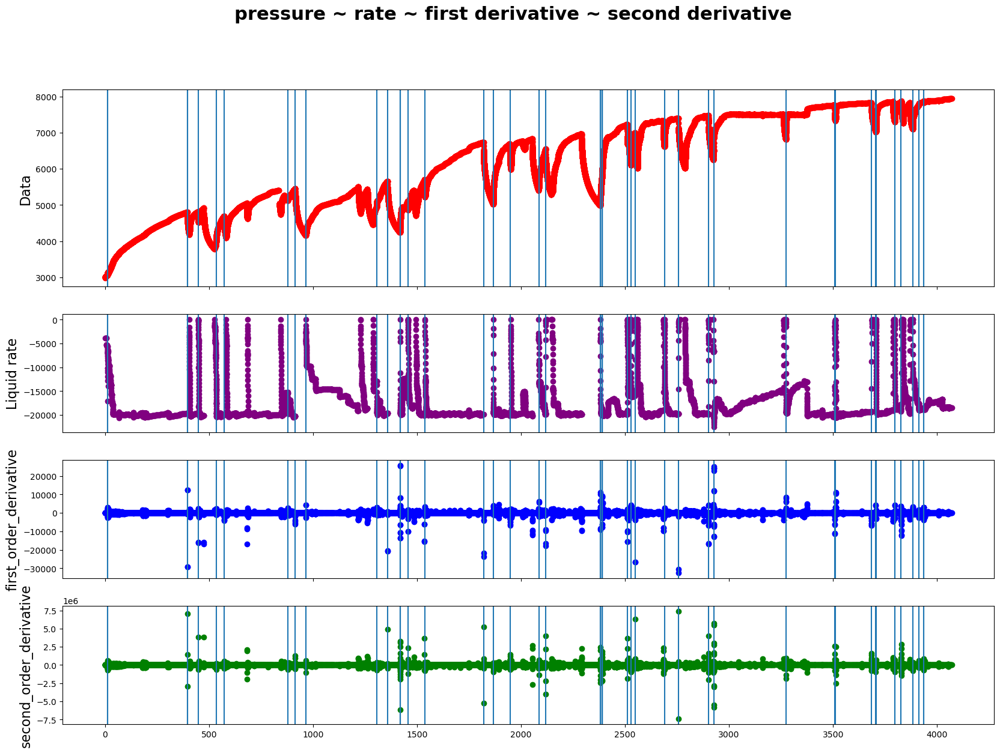

In [17]:
plot_4_metrics(pressure_df,
               rate_df,
               breakpoints)

In [18]:
# fig, axs = plt.subplots(nrows=4, sharex=True, dpi=100,figsize=(20,14), gridspec_kw={'height_ratios': [5, 3,3,3]})

# fig.suptitle('pressure ~ rate ~ first derivative ~ second derivative', 
#           **{'family': 'Arial Black', 'size': 22, 'weight': 'bold'})

# #plot pressure and breakpoints
# axs[0].scatter(x=pressure_df[pressure_time],y=pressure_df[pressure_measure],color='red') 
# axs[0].set_ylabel(pressure_measure,fontsize=16)
# for breakpoint_index in breakpoints:
#         axs[0].axvline(x=pressure_df[pressure_time][breakpoint_index])


# #plot rate and breakpoints       
# start_time=pressure_df.iloc[0][pressure_time]
# end_time=pressure_df.iloc[-1][pressure_time]
# rate_df=rate_df.loc[(rate_df[rate_time] >= start_time) & (rate_df[rate_time] <= end_time)]

# axs[1].scatter(x=rate_df[rate_time],y=rate_df[rate_measure],color='purple') 
# axs[1].set_ylabel(rate_measure,fontsize=16)
# for breakpoint_index in breakpoints:
#         axs[1].axvline(x=pressure_df[pressure_time][breakpoint_index])

# #plot first derivative and breakpoints
# axs[2].scatter(x=pressure_df[pressure_time],y=pressure_df[first_order_derivative],color='blue') 
# axs[2].set_ylabel(first_order_derivative,fontsize=16)
# for breakpoint_index in breakpoints:
#         axs[2].axvline(x=pressure_df[pressure_time][breakpoint_index])

# #plot second derivative and breakpoints
# axs[3].scatter(x=pressure_df[pressure_time],y=pressure_df[second_order_derivative],color='green') 
# axs[3].set_ylabel(second_order_derivative,fontsize=16)
# for breakpoint_index in breakpoints:
#         axs[3].axvline(x=pressure_df[pressure_time][breakpoint_index])

In [19]:
def group_index(data, bin_start, bin_end, bin_step):
    x = np.array(data)
    bin_edges = np.arange(bin_start, bin_end + bin_step, bin_step)
    bin_number = bin_edges.size - 1
    cond = np.zeros((x.size, bin_number), dtype=bool)
    for i in range(bin_number):
        cond[:, i] = np.logical_and(bin_edges[i] < x,
                                    x < bin_edges[i+1])
    return [list(x[cond[:, i]]) for i in range(bin_number)]

# data=breakpoints 
# bin_start=0
# bin_end=len(pressure_df[pressure_time])
# bin_step=100
# group_index(breakpoints, 0, len(pressure_df[pressure_time]), N)

In [20]:
def plot_4_metrics_details(data_inOneRow:int,
                           pressure_df:pd.DataFrame,
                           rate_df:pd.DataFrame,
                           breakpoints:List[int],
                           colum_names:Dict[str,List[str]]
                               ={"pressure":["Elapsed time","Data","first_order_derivative","second_order_derivative"],
                                "rate":["Elapsed time","Liquid rate"]})->None:
    
    pressure_time, pressure_measure,first_order_derivative,second_order_derivative=colum_names["pressure"]
    rate_time, rate_measure = colum_names["rate"]
    
    size=len(pressure_df)
    sub_pressure_df = [pressure_df.iloc[x:x+data_inOneRow,:] for x in range(0, len(pressure_df), data_inOneRow)]
    grouped_breakpoints=group_index(breakpoints, 0, size, data_inOneRow)
#     print(grouped_breakpoints)
    print(len(grouped_breakpoints))
    count_breakpoints=0

    for sub_pressure_df,sub_breakpoints in zip(sub_pressure_df,grouped_breakpoints):
        count_breakpoints+=len(sub_breakpoints)
            
        #extract rate data for subplot     
        start_time=sub_pressure_df.iloc[0][pressure_time]
        end_time=sub_pressure_df.iloc[-1][pressure_time]
        sub_rate_df=rate_df.loc[(rate_df[rate_time] >= start_time) & (rate_df[rate_time] <= end_time)]
        
        plot_4_metrics(sub_pressure_df,
               sub_rate_df,
               sub_breakpoints,colum_names)
    print("count_breakpoints",count_breakpoints)
    return None

100


C:\Users\junec\AppData\Local\Temp/ipykernel_4340/1421089929.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(nrows=4, sharex=True, dpi=100,figsize=(20,14), gridspec_kw={'height_ratios': [5, 3,3,3]})


count_breakpoints 53


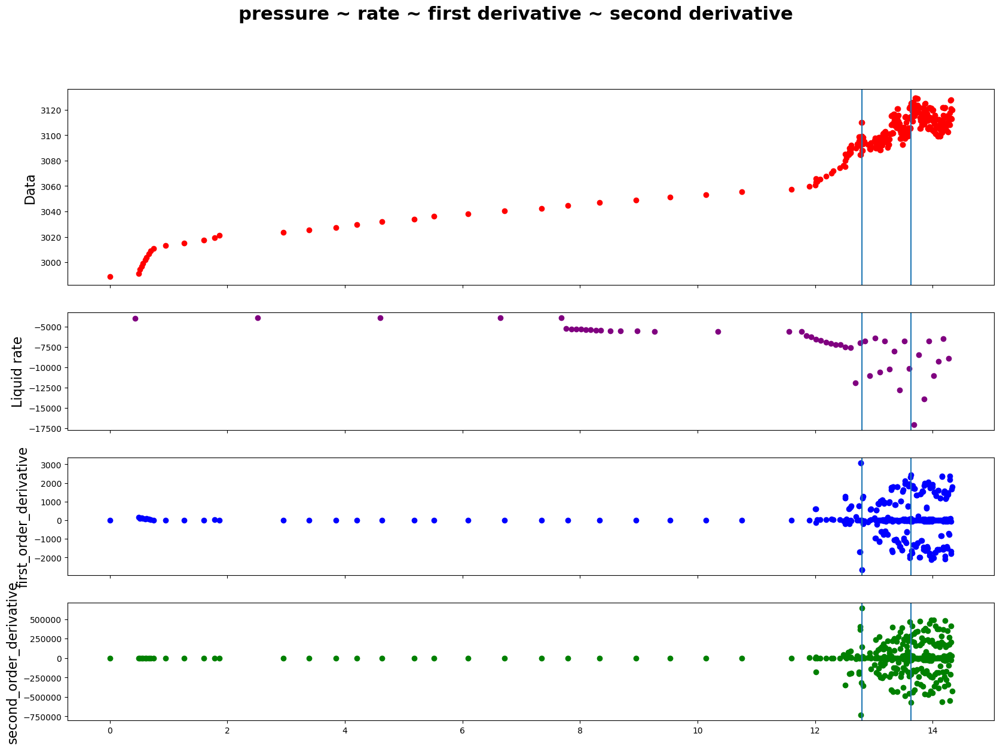

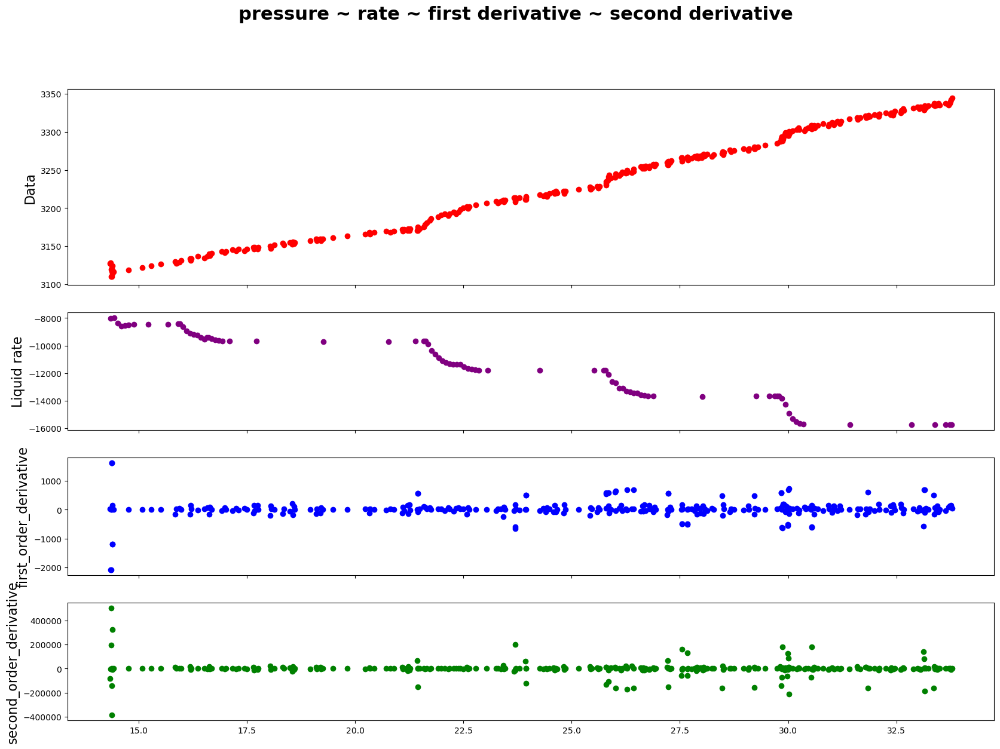

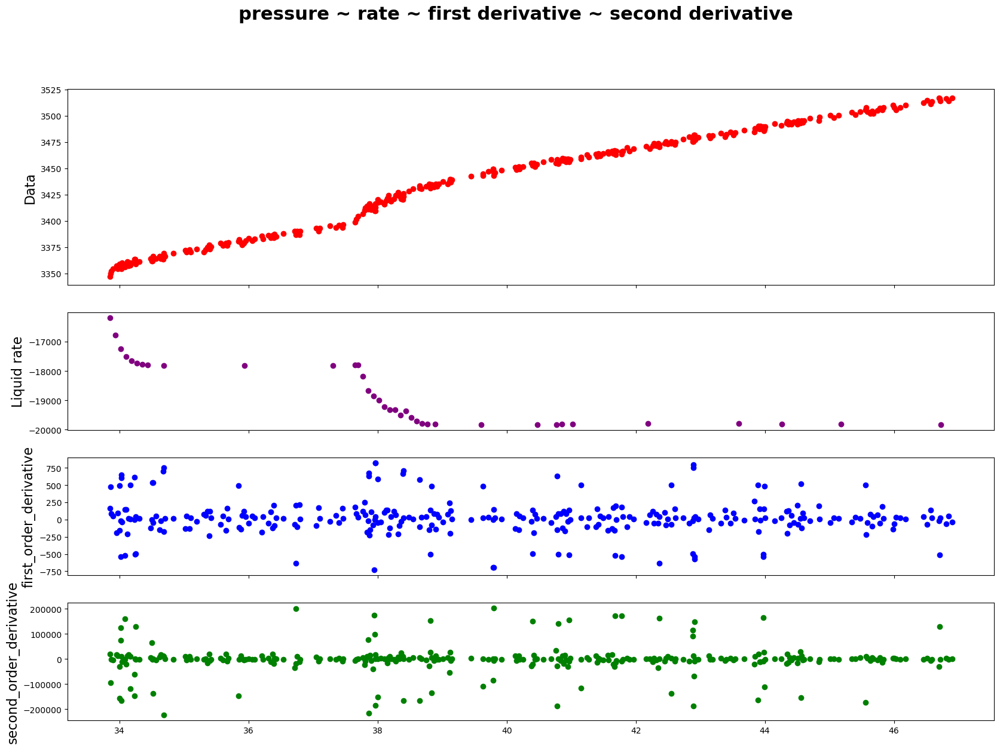

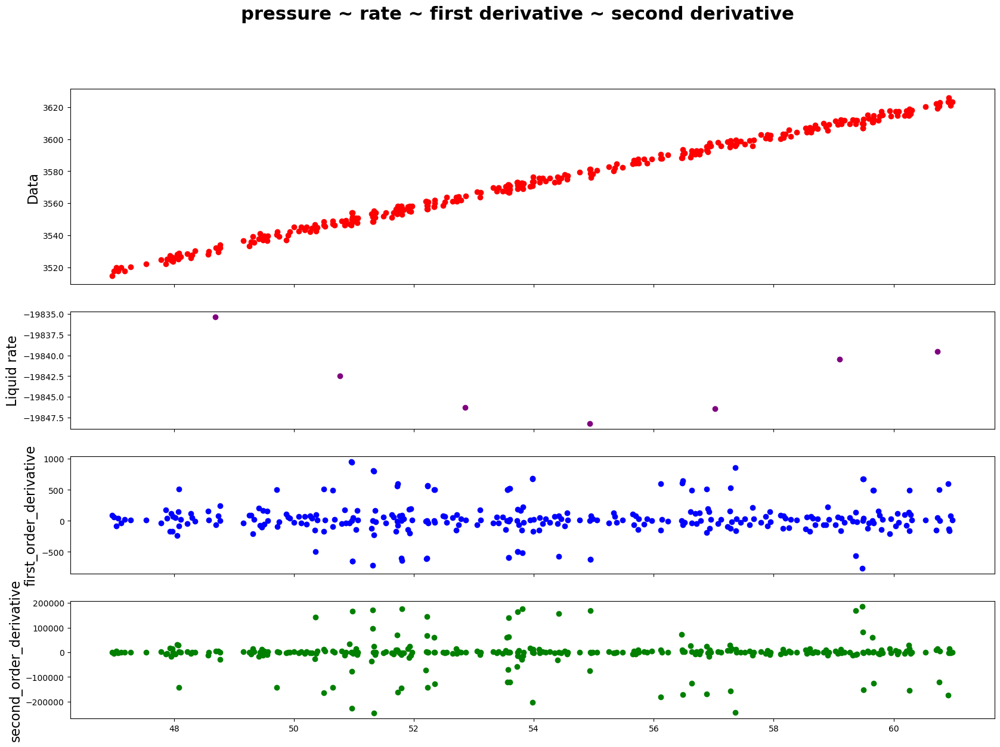

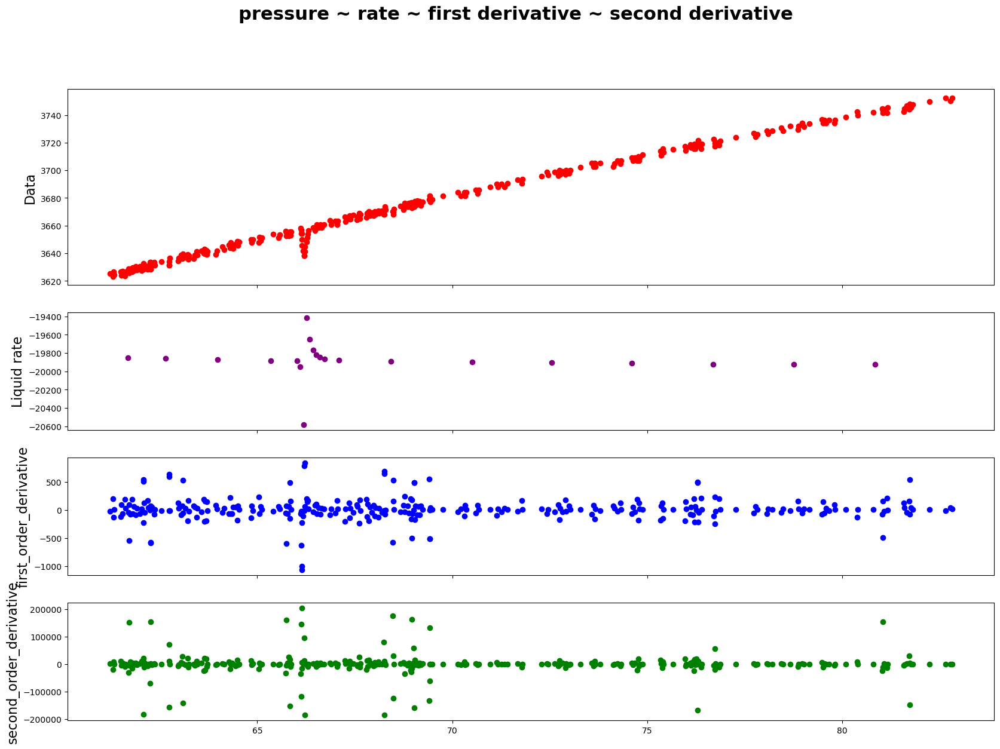

...

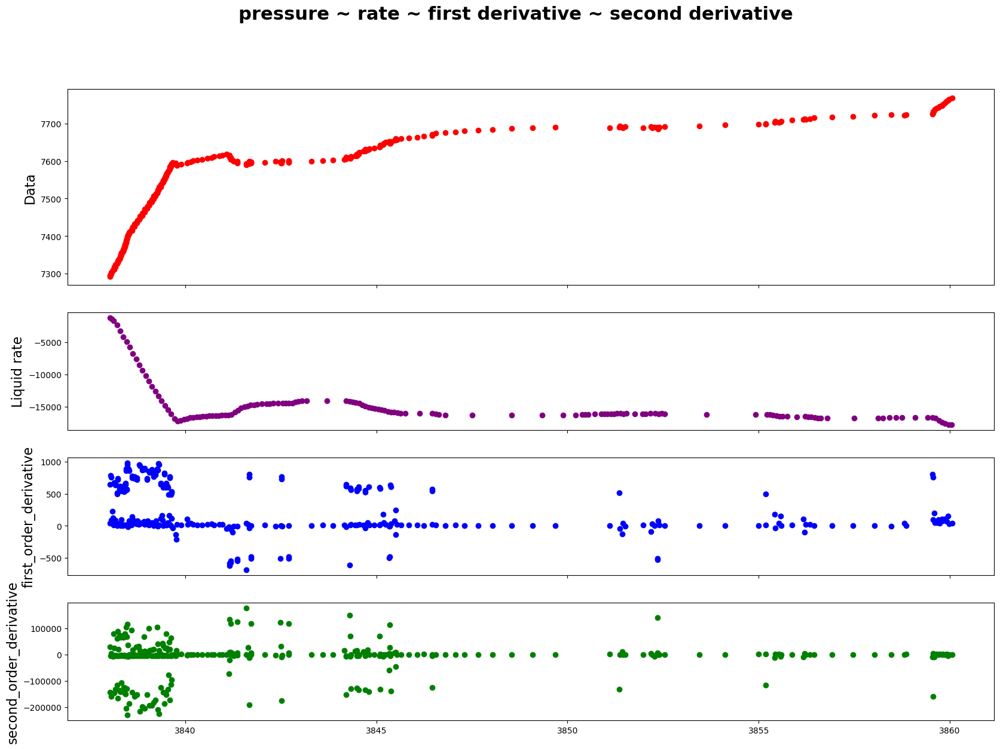

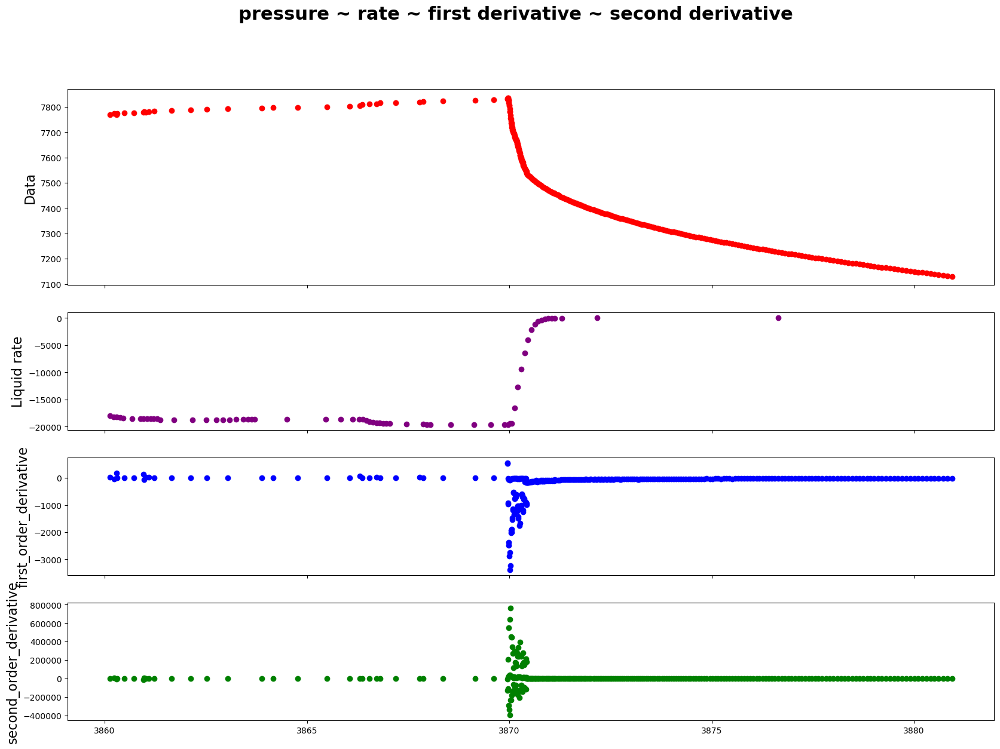

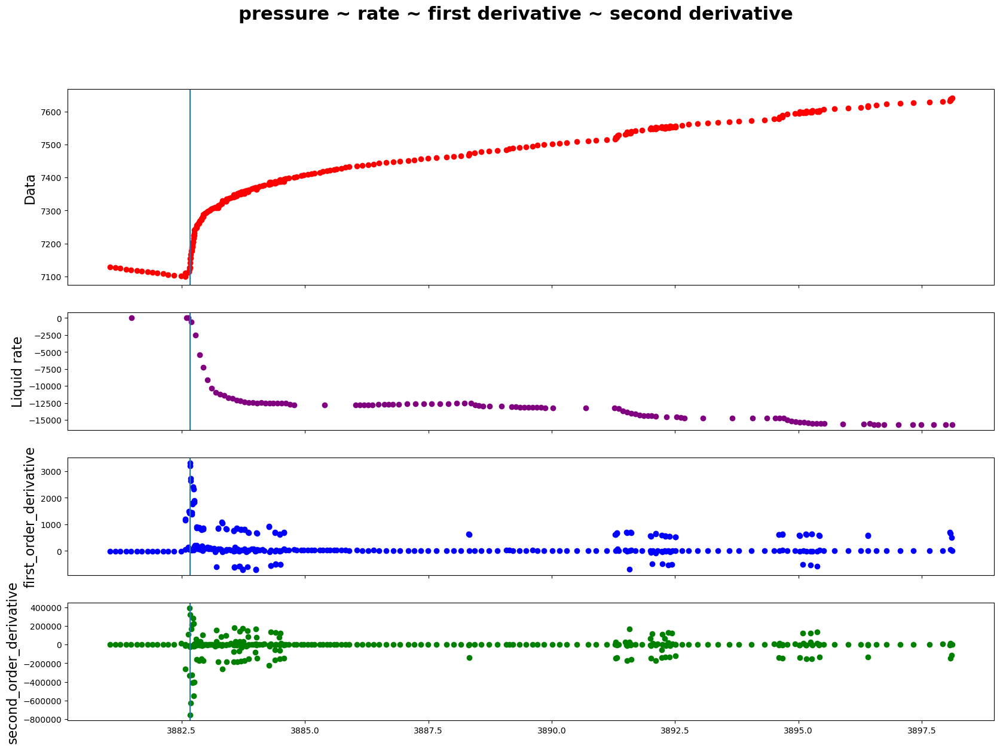

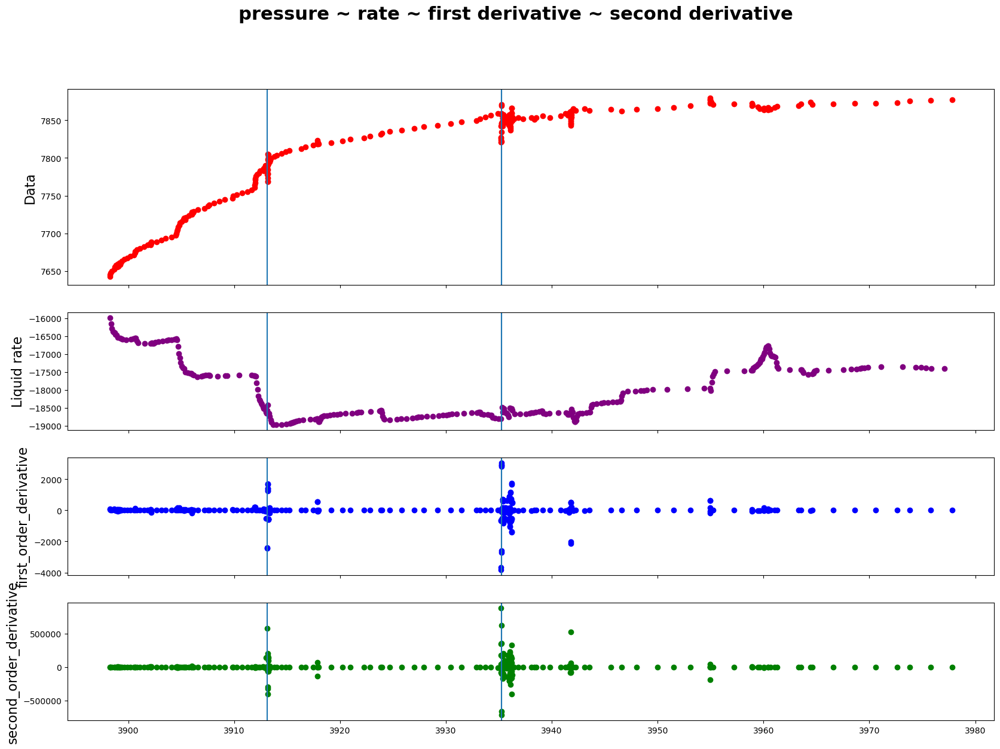

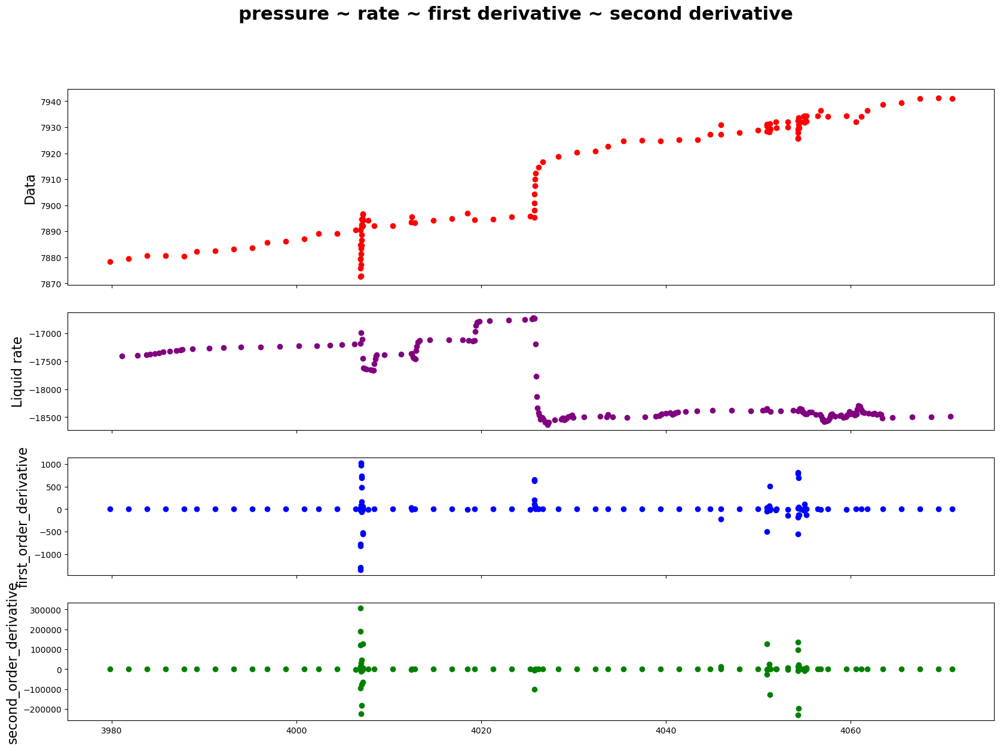

In [21]:
data_inOneRow=300
plot_4_metrics_details(data_inOneRow,
                           pressure_df,
                           rate_df,
                           breakpoints)

In [22]:
def plot_pressure_transients(N,pressure_df,breakpoints,figsize):
    rcParams.update({'figure.autolayout': True})
#     plt.figure(figsize=(14,9), dpi=600)

    timeP = pressure_df[pressure_time]
    pressure = pressure_df[pressure_measure]
    

    size=len(timeP)

    vline=group_index(breakpoints, 0, size, N)

    sublists_timeP = [timeP[x:x+N] for x in range(0, len(timeP), N)]
    sublists_pressure = [pressure[x:x+N] for x in range(0, len(pressure), N)]

    fig, axs = plt.subplots(nrows=size//N+1, sharey=True, figsize=(20,80), dpi=50)
  
    fig.suptitle('Graph', 
              **{'family': 'Arial Black', 'size': 22, 'weight': 'bold'})

    plot_count=1
    breakpoints_counts=0
    for ax, x_timeP, y_pressure,vline_subplot in zip(axs, sublists_timeP, sublists_pressure,vline):
        ax.scatter(x_timeP,y_pressure)
        breakpoints_counts+=len(vline_subplot)
        for breakpoint_index in vline_subplot:
            ax.axvline(x=pressure_df[pressure_time][breakpoint_index])

        plot_count+=1
    print("breakpoints_counts",breakpoints_counts)
    plt.savefig('1.png')
    plt.show()

In [23]:
print(breakpoints)
print(len(breakpoints))
figsize=(20,60)
N=300
plot_pressure_transients(N,pressure_df,breakpoints,figsize)

[67, 175, 2249, 2252, 2805, 3694, 3989, 5771, 5986, 6544, 6547, 8605, 9025, 9620, 9629, 9641, 10151, 11484, 12364, 13040, 13868, 15433, 16098, 18457, 18468, 18815, 18821, 18824, 18827, 18830, 18836, 18847, 19643, 20362, 20701, 22183, 22711, 24264, 24796, 26019, 26656, 26783, 27023, 27316, 27319, 27963, 27966, 28243, 28263, 29122, 29484, 29547, 29553]
53


NameError: name 'pressure_time' is not defined